# Environment

This demo was presented on [baldur.astro.washington.edu/jupyter](baldur.astro.washington.edu/jupyter) with the shared jupyter kernel `kbmod/w_2023_38`. 

It assumes that the user has read access to the test data at `/epyc/projects/kbmod/data` on epyc and is assumed to be executed on baldur.

This notebook is currently stored for shared access in `/epyc/projects/kbmod/jupyter/notebooks/e2e`

# Setup

In [1]:
import kbmod

from region_search import RegionSearch

# Inspect the butler repo's contents
While you can inspect the butler repo in a fairly straightforwared manner, the `RegionSearch` module provides some static methods that can help you pick which collections and datatypes to query from the butler. 

In [2]:
REPO_PATH = "/epyc/projects/kbmod/data/imdiff_w09_gaiadr3"

In [3]:
RegionSearch.get_collection_names(repo_path=REPO_PATH)

['DECam/calib/bias/master/20210318/20230523T202149Z',
 'DECam/calib/flat/master/20210318/20230523T202441Z',
 'DECam/calib/bias/20210318',
 'DECam/calib/flat/20210318',
 'refcats/gaia_dr3_20230707',
 'refcats/ps1_pv3_3pi_20170110',
 'DECam/fakes/raw',
 'DECam/calib',
 'DECam/calib/unbounded',
 'DECam/calib/curated/19700101T000000Z',
 'DECam/calib/curated/20130115T013000Z',
 'DECam/calib/curated/20130916T092600Z',
 'DECam/calib/curated/20140117T012900Z',
 'DECam/calib/curated/20141020T103000Z',
 'DECam/calib/curated/20150105T011500Z',
 'DECam/calib/curated/20131130T000000Z',
 'DECam/calib/curated/20120912T000000Z',
 'DECam/raw/20210318',
 'DECam/raw/crosstalk/20210318/20240403T210357Z',
 'DECam/calexp/20210318/20240403T210457Z',
 'skymaps',
 'DECam/fakes/partitioned/20240403T210927Z',
 'DECam/withFakes/20210318/20240403T210948Z',
 'DECam/imdiffs/20210318/20240403T211102Z',
 'DECam/calib/20210318',
 'refcats',
 'DECam/raw/crosstalk/20210318',
 'DECam/calexp/20210318',
 'DECam/fakes/partit

For this example, we want to pick one of the collections with fakes and we'll use 'DECam/withFakes/20210318'.

We now want to inspect how many datarefs are associated with each datatype we can query from this collection.

In [4]:
collections = ["DECam/withFakes/20210318"]

RegionSearch.get_dataset_type_freq(repo_path=REPO_PATH, collections=collections)

{'bias': 1,
 'flat': 1,
 'gaia_dr3_20230707': 58,
 'ps1_pv3_3pi_20170110': 58,
 'raw_fakes': 1,
 'camera': 1,
 'defects': 365,
 'transmission_atmosphere': 1,
 'transmission_system': 310,
 'crosstalk': 62,
 'linearizer': 62,
 'raw': 620,
 'packages': 4,
 'isrForCrosstalkSources_config': 1,
 'overscanRaw': 10,
 'isrForCrosstalkSources_metadata': 10,
 'isrForCrosstalkSources_log': 10,
 'icSrc_schema': 1,
 'isr_config': 1,
 'src_schema': 1,
 'calibrate_config': 1,
 'characterizeImage_config': 1,
 'visitSummary_schema': 1,
 'consolidateVisitSummary_config': 1,
 'icExp': 10,
 'icExpBackground': 10,
 'icSrc': 10,
 'postISRCCD': 10,
 'calexp': 10,
 'isr_metadata': 10,
 'isr_log': 10,
 'srcMatchFull': 10,
 'src': 10,
 'calexpBackground': 10,
 'srcMatch': 10,
 'calibrate_metadata': 10,
 'calibrate_log': 10,
 'characterizeImage_metadata': 10,
 'characterizeImage_log': 10,
 'visitSummary': 10,
 'consolidateVisitSummary_metadata': 10,
 'consolidateVisitSummary_log': 10,
 'skyMap': 1,
 'partitionFak

# Fetch Data from the Butler for Region Search

From the above, 'fakes_calexp' seems a reasonable choice for a datatype we can limit our queries to.

In the following, we construct a `RegionSearch` object which will instantiate a butler for our repo and fetch the image data keyed by (Visit, Detector, Region) (aka VDR) along with some associated metadata and calculations in an astropy table.

In [5]:
dataset_types = ["fakes_calexp"]
rs = RegionSearch(
    REPO_PATH, collections, dataset_types, visit_info_str="calexp.visitInfo", fetch_data_on_start=True
)

rs.vdr_data

<string>:1: FutureWarning: Call to deprecated method __iter__. (Using DataCoordinate as a Mapping is deprecated in favor of the .mapping and .required attributes, and will be dropped after v27.) -- Deprecated since version v27.
/astro/store/epyc/projects/kbmod/stack/w_2024_09/conda/envs/lsst-scipipe-8.0.0/share/eups/Linux64/daf_butler/gb6936e0f18+3f3301cb17/python/lsst/daf/butler/dimensions/_coordinate.py:545: FutureWarning: Call to deprecated method keys. (Using DataCoordinate as a Mapping is deprecated in favor of the .mapping and .required attributes, and will be dropped after v27.) -- Deprecated since version v27.
  return iter(self.keys())
/astro/store/epyc/projects/kbmod/stack/w_2024_09/conda/envs/lsst-scipipe-8.0.0/share/eups/Linux64/daf_butler/gb6936e0f18+3f3301cb17/python/lsst/daf/butler/dimensions/_coordinate.py:565: FutureWarning: Call to deprecated function (or staticmethod) graph. (DataCoordinate.graph is deprecated in favor of .dimensions, and will be dropped after v27.) 

data_id,region,detector,uri,center_coord
object[3],object,int64,str261,float64[2]
instrument .. visit,"ConvexPolygon([UnitVector3d(-0.8572310214106003, 0.5140136573995331, 0.03073981031324692), UnitVector3d(-0.8573126243779648, 0.514061814910292, 0.027486624625501416), UnitVector3d(-0.8603167349539873, 0.5090182552169222, 0.027486931695458513), UnitVector3d(-0.8602353512965948, 0.508969729485055, 0.03074011788419143)])",35,/epyc/projects/kbmod/data/imdiff_w09_gaiadr3/DECam/withFakes/20210318/20240403T210948Z/fakes_calexp/20210319/i/i_DECam_SDSS_c0003_7835.0_1470.0/974892/fakes_calexp_DECam_i_i_DECam_SDSS_c0003_7835_0_1470_0_974892_N4_DECam_withFakes_20210318_20240403T210948Z.fits,149.22048433783849 .. 1.6683119078312947
instrument .. visit,"ConvexPolygon([UnitVector3d(-0.8709063227199754, 0.49048670961887364, 0.030740278684830185), UnitVector3d(-0.8709892077685559, 0.49053262854455665, 0.0274870930414856), UnitVector3d(-0.8738549039182039, 0.48540915703478454, 0.027487400111442725), UnitVector3d(-0.8737722280742154, 0.48536286405417617, 0.030740586255774707)])",35,/epyc/projects/kbmod/data/imdiff_w09_gaiadr3/DECam/withFakes/20210318/20240403T210948Z/fakes_calexp/20210319/i/i_DECam_SDSS_c0003_7835.0_1470.0/974895/fakes_calexp_DECam_i_i_DECam_SDSS_c0003_7835_0_1470_0_974895_N4_DECam_withFakes_20210318_20240403T210948Z.fits,150.78044267529404 .. 1.6683387562729661
instrument .. visit,"ConvexPolygon([UnitVector3d(-0.8632807208053553, 0.5017969238521098, 0.054279317408622074), UnitVector3d(-0.8634293237866446, 0.5018822737832265, 0.051029266970199966), UnitVector3d(-0.8663644987606522, 0.49679828690228733, 0.05102957395625042), UnitVector3d(-0.8662161100467123, 0.49671256579311107, 0.05427962489522404)])",35,/epyc/projects/kbmod/data/imdiff_w09_gaiadr3/DECam/withFakes/20210318/20240403T210948Z/fakes_calexp/20210319/i/i_DECam_SDSS_c0003_7835.0_1470.0/974898/fakes_calexp_DECam_i_i_DECam_SDSS_c0003_7835_0_1470_0_974898_N4_DECam_withFakes_20210318_20240403T210948Z.fits,150.0003968306607 .. 3.0182803350237144
instrument .. visit,"ConvexPolygon([UnitVector3d(-0.8572306476090913, 0.5140142807953888, 0.03073981031329064), UnitVector3d(-0.8573122505414348, 0.5140624383654911, 0.027486624625545138), UnitVector3d(-0.8603163647852367, 0.5090188808567737, 0.027486931695502228), UnitVector3d(-0.8602349811631328, 0.5089703550657229, 0.030740117884235148)])",35,/epyc/projects/kbmod/data/imdiff_w09_gaiadr3/DECam/withFakes/20210318/20240403T210948Z/fakes_calexp/20210319/i/i_DECam_SDSS_c0003_7835.0_1470.0/974901/fakes_calexp_DECam_i_i_DECam_SDSS_c0003_7835_0_1470_0_974901_N4_DECam_withFakes_20210318_20240403T210948Z.fits,149.2204426711717 .. 1.6683119078338005
instrument .. visit,"ConvexPolygon([UnitVector3d(-0.8709066920283894, 0.490486083334642, 0.030739808639786412), UnitVector3d(-0.8709895757751559, 0.4905320014532335, 0.027486622951882263), UnitVector3d(-0.8738552681990356, 0.4854085278595403, 0.027486930021839356), UnitVector3d(-0.8737725936565892, 0.4853622356858718, 0.030740116210730917)])",35,/epyc/projects/kbmod/data/imdiff_w09_gaiadr3/DECam/withFakes/20210318/20240403T210948Z/fakes_calexp/20210319/i/i_DECam_SDSS_c0003_7835.0_1470.0/974904/fakes_calexp_DECam_i_i_DECam_SDSS_c0003_7835_0_1470_0_974904_N4_DECam_withFakes_20210318_20240403T210948Z.fits,150.7804843419605 .. 1.6683118119035987
instrument .. visit,"ConvexPolygon([UnitVector3d(-0.8632815518374847, 0.5017949720584495, 0.05428414385365578), UnitVector3d(-0.8634301686036089, 0.5018803295307347, 0.051034094243599164), UnitVector3d(-0.8663653328545027, 0.4967963364589571, 0.0510344012296149), UnitVector3d(-0.8662169303549427, 0.49671060780815945, 0.05428445134022294)])",35,/epyc/projects/kbmod/data/imdiff_w09_gaiadr3/DECam/withFakes/20210318/20240403T210948Z/fakes_calexp/20210319/i/i_DECam_SDSS_c0003_7835.0_1470.0/974963/fakes_calexp_DECam_i_i_DECam_SDSS_c0003_7835_0_1470_0_974963_N4_DECam_withFakes_20210318_20240403T210948Z.fits,150.00051766398744 .. 3.0185572787976382
instrument .. vi

# Find Discrete Piles

In the 10 images above we want to find

In [6]:
overlapping_sets = rs.find_overlapping_coords(uncertainty_radius=30)
print(f"Found {len(overlapping_sets)} discrete piles")
for i in range(len(overlapping_sets)):
    print(
        f"In overlapping set {i + 1}, we have the following indices for images in the VDR data table: {overlapping_sets[i]}"
    )

Found 3 discrete piles
In overlapping set 1, we have the following indices for images in the VDR data table: [0, 3, 6, 9]
In overlapping set 2, we have the following indices for images in the VDR data table: [1, 4, 7]
In overlapping set 3, we have the following indices for images in the VDR data table: [2, 5, 8]


## Create an ImageCollection
The first pile has the most images, so we'll use it to create a KBMOD ImageCollection from which we can run a search.

In [7]:
ic = rs.create_image_collection(overlapping_sets[0])
ic

mjd,filter,visit_id,observat,obs_lat,obs_lon,obs_elev,location,ra,dec
float64,str32,int64,str4,float64,float64,float64,str261,float64,float64
59292.02017523787,i DECam SDSS c0003 7835.0 1470.0,974892,CTIO,-30.16606,-70.81489,2215.00000000056,/epyc/projects/kbmod/data/imdiff_w09_gaiadr3/DECam/withFakes/20210318/20240403T210948Z/fakes_calexp/20210319/i/i_DECam_SDSS_c0003_7835.0_1470.0/974892/fakes_calexp_DECam_i_i_DECam_SDSS_c0003_7835_0_1470_0_974892_N4_DECam_withFakes_20210318_20240403T210948Z.fits,149.22431289747115,1.665473784577742
59292.03280636261,i DECam SDSS c0003 7835.0 1470.0,974901,CTIO,-30.16606,-70.81489,2215.00000000056,/epyc/projects/kbmod/data/imdiff_w09_gaiadr3/DECam/withFakes/20210318/20240403T210948Z/fakes_calexp/20210319/i/i_DECam_SDSS_c0003_7835.0_1470.0/974901/fakes_calexp_DECam_i_i_DECam_SDSS_c0003_7835_0_1470_0_974901_N4_DECam_withFakes_20210318_20240403T210948Z.fits,149.22224630845233,1.664704847648954
59292.10603385058,i DECam SDSS c0003 7835.0 1470.0,974966,CTIO,-30.16606,-70.81489,2215.00000000056,/epyc/projects/kbmod/data/imdiff_w09_gaiadr3/DECam/withFakes/20210318/20240403T210948Z/fakes_calexp/20210319/i/i_DECam_SDSS_c0003_7835.0_1470.0/974966/fakes_calexp_DECam_i_i_DECam_SDSS_c0003_7835_0_1470_0_974966_N4_DECam_withFakes_20210318_20240403T210948Z.fits,149.22132012106402,1.6672317578121474
59292.11868117006,i DECam SDSS c0003 7835.0 1470.0,974975,CTIO,-30.16606,-70.81489,2215.00000000056,/epyc/projects/kbmod/data/imdiff_w09_gaiadr3/DECam/withFakes/20210318/20240403T210948Z/fakes_calexp/20210319/i/i_DECam_SDSS_c0003_7835.0_1470.0/974975/fakes_calexp_DECam_i_i_DECam_SDSS_c0003_7835_0_1470_0_974975_N4_DECam_withFakes_20210318_20240403T210948Z.fits,149.22158239521355,1.6670370863467159


# Create a KBMOD Workunit from the ImageCollection

Use KBMOD to search for trajectories in one of the identified discrete piles

In [8]:
from pathlib import Path
import os
import numpy as np

results_suffix = "DEMO"

res_filepath = "./demo_results"
if not Path(res_filepath).is_dir():
    os.mkdir(res_filepath)

# The demo data has an object moving at x_v=10 px/day
# and y_v = 0 px/day. So we search velocities [0, 20].
v_min = 3000
v_max = 4000
v_steps = 50
v_arr = [v_min, v_max, v_steps]

# angle with respect to ecliptic, in radians
ang_below = 3 * np.pi / 2  # 0
ang_above = 2 * np.pi  # 1
ang_steps = 50  # 21
ang_arr = [ang_below, ang_above, ang_steps]

# There are 3 images in the demo data. Make sure we see
# the object in at least 2.
num_obs = 2

input_parameters = {
    # Required
    "res_filepath": res_filepath,
    "output_suffix": results_suffix,
    "v_arr": v_arr,
    "ang_arr": ang_arr,
    # Important
    "num_obs": 2,
    "do_mask": False,
    "lh_level": 10.0,
    "gpu_filter": True,
    # Fine tuning
    "sigmaG_lims": [15, 60],
    "mom_lims": [37.5, 37.5, 1.5, 1.0, 1.0],
    "peak_offset": [3.0, 3.0],
    "chunk_size": 1000000,
    "stamp_type": "cpp_median",
    "eps": 0.03,
    "clip_negative": True,
    "mask_num_images": 0,
    "cluster_type": "position",
    "average_angle": 0.0,
}

config = kbmod.configuration.SearchConfiguration()
config.set_multiple(input_parameters)

wunit = ic.toWorkUnit(config)

# Visualize Our ImageCollection

The following defines some helper functions for visualizing the images in our `WorkUnit`. We can quickly inspect these to sanity check.

In [9]:
import matplotlib.pyplot as plt
import numpy as np

from astropy.visualization import astropy_mpl_style
from astropy.visualization import ZScaleInterval, simple_norm, imshow_norm, ZScaleInterval, SinhStretch


def get_image(workunit, n):
    return workunit.im_stack.get_images()[n]


def get_science_image(workunit, n):
    return get_image(workunit, n).get_science().image


def get_variance_image(workunit, n):
    return get_image(workunit, n).get_variance().image


def get_mask_image(workunit, n):
    return get_image(workunit, n).get_mask().image


def plot_img(img):
    fig, ax = plt.subplots(figsize=(25, 25))
    _ = imshow_norm(
        img.T, ax, cmap="gray", origin="lower", interval=ZScaleInterval(contrast=0.5), stretch=SinhStretch()
    )
    plt.show()

## The Science Images

/astro/store/epyc/projects/kbmod/stack/w_2024_09/conda/envs/lsst-scipipe-8.0.0/lib/python3.11/site-packages/astropy/visualization/stretch.py:555: RuntimeWarning: overflow encountered in sinh
  np.sinh(values, out=values)
/astro/store/epyc/projects/kbmod/stack/w_2024_09/conda/envs/lsst-scipipe-8.0.0/lib/python3.11/site-packages/matplotlib/colors.py:732: RuntimeWarning: overflow encountered in multiply
  xa *= self.N


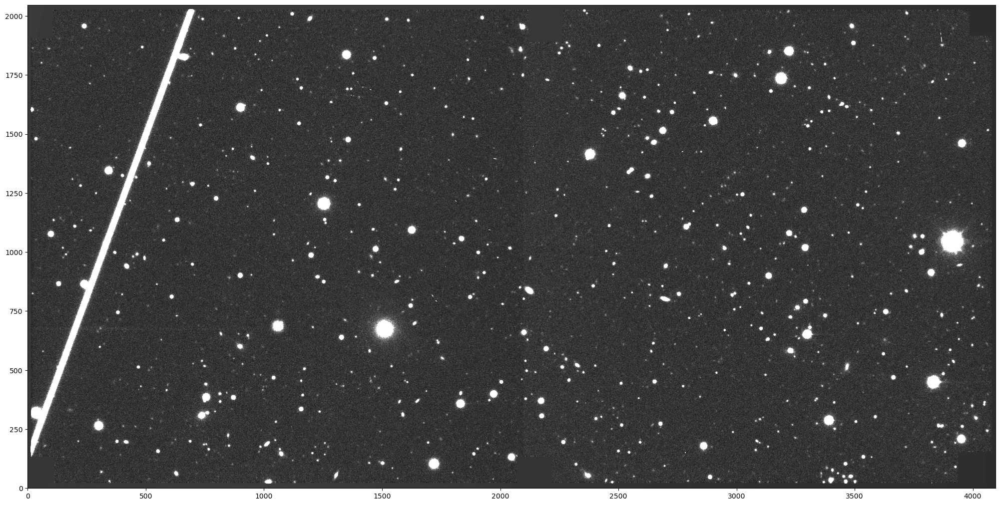

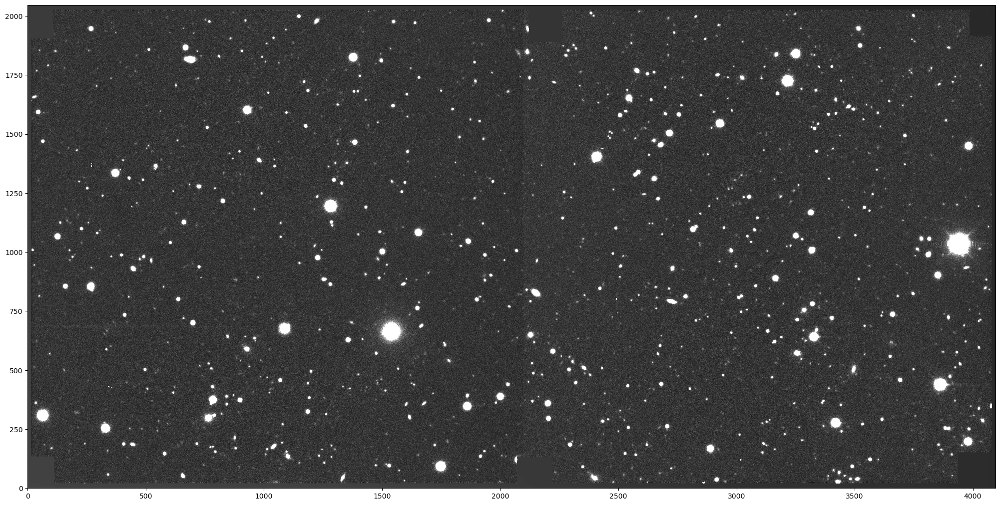

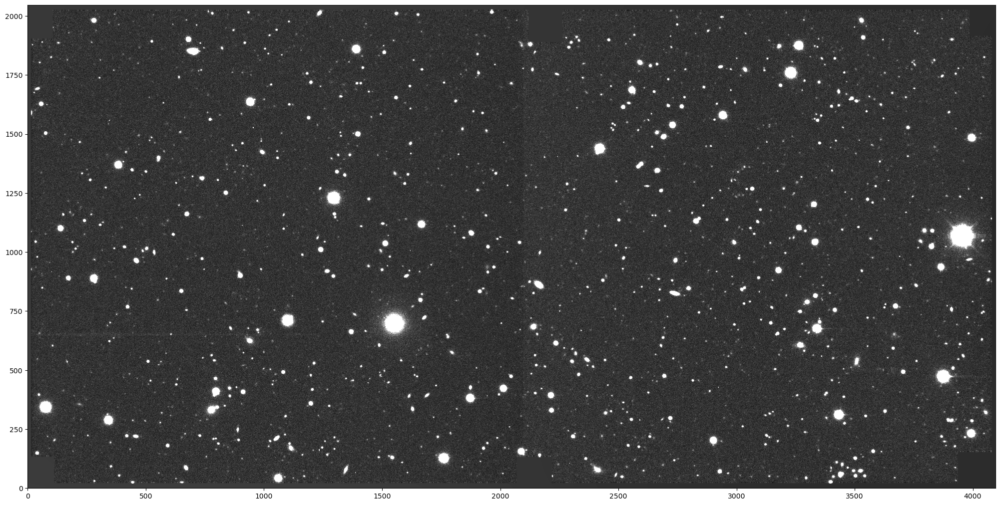

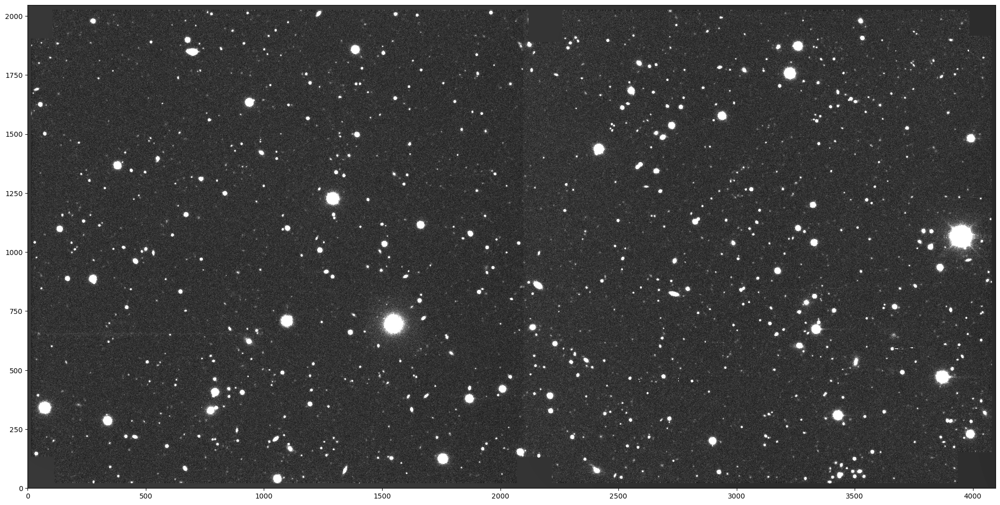

In [10]:
for i in range(len(ic)):
    plot_img(get_science_image(wunit, i))

## The Variance Images

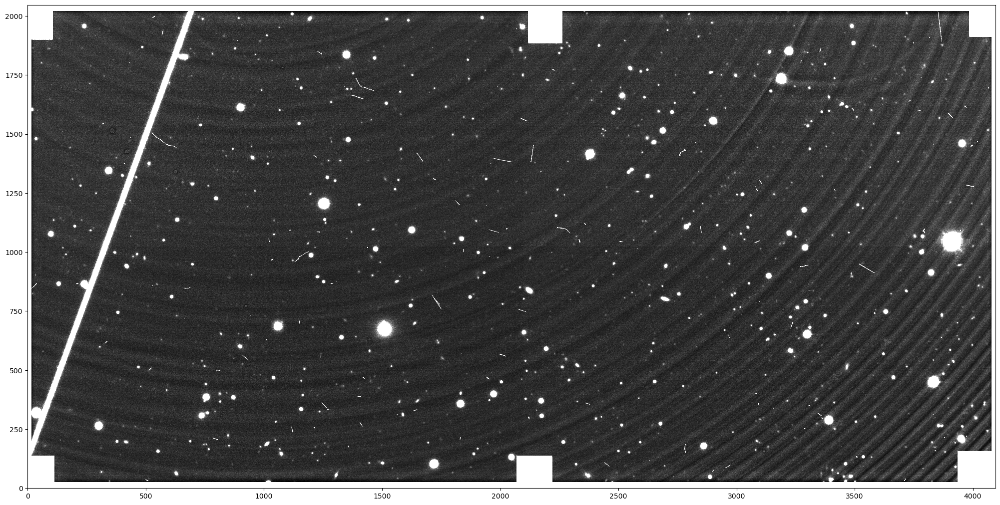

In [ ]:
for i in range(len(ic)):
    plot_img(get_variance_image(wunit, i))

# Create a Reprojected Workunit

First we'll need to create a new initial work unit so results can be saved in a different directory

In [ ]:
from pathlib import Path
import os

results_suffix = "REPROJECT_DEMO"

res_filepath = "./reproject_demo_results"
if not Path(res_filepath).is_dir():
    os.mkdir(res_filepath)

# The demo data has an object moving at x_v=10 px/day
# and y_v = 0 px/day. So we search velocities [0, 20].
v_min = 3000
v_max = 4000
v_steps = 50
v_arr = [v_min, v_max, v_steps]

# angle with respect to ecliptic, in radians
ang_below = 3 * np.pi / 2  # 0
ang_above = 2 * np.pi  # 1
ang_steps = 50  # 21
ang_arr = [ang_below, ang_above, ang_steps]

# There are 3 images in the demo data. Make sure we see
# the object in at least 2.
num_obs = 2

input_parameters = {
    # Required
    "res_filepath": res_filepath,
    "output_suffix": results_suffix,
    "v_arr": v_arr,
    "ang_arr": ang_arr,
    # Important
    "num_obs": 2,
    "do_mask": False,
    "lh_level": 10.0,
    "gpu_filter": True,
    # Fine tuning
    "sigmaG_lims": [15, 60],
    "mom_lims": [37.5, 37.5, 1.5, 1.0, 1.0],
    "peak_offset": [3.0, 3.0],
    "chunk_size": 1000000,
    "stamp_type": "cpp_median",
    "eps": 0.03,
    "clip_negative": True,
    "mask_num_images": 0,
    "cluster_type": "position",
    "average_angle": 0.0,
}

config = kbmod.configuration.SearchConfiguration()
config.set_multiple(input_parameters)

new_wunit = ic.toWorkUnit(config)

In [ ]:
%%time
from kbmod import reprojection

common_wcs = new_wunit._per_image_wcs[0]

uwunit = reprojection.reproject_work_unit(new_wunit, common_wcs)

# Let's visualize our reprojected images.

## The reprojected science images

In [ ]:
for i in range(len(ic)):
    plot_img(get_science_image(uwunit, i))

## The reprojected variance images

In [ ]:
for i in range(len(ic)):
    plot_img(get_variance_image(uwunit, i))

# Run KBMOD Search without Reprojection

In [ ]:
res = kbmod.run_search.SearchRunner().run_search_from_work_unit(wunit)

# Inspect the Results

In [ ]:
trajectories = [t.trajectory for t in sorted(res.results, key=lambda x: x.trajectory.lh, reverse=True)]

In [ ]:
trajectories

In [ ]:
# We can create stamps for each result
imgstack = wunit.im_stack

# Create the stamps around remaining results
nres = len(trajectories)
fig, axes = plt.subplots(nres, 3, figsize=(10, nres * 3), sharey=True, sharex=True)

stamp_size = 20
for row, traj in zip(axes, trajectories):
    stamps = kbmod.search.StampCreator.get_stamps(imgstack, traj, stamp_size)
    for ax, stamp in zip(row, stamps):
        ax.imshow(stamp.image, interpolation=None, cmap="gist_heat")

plt.tight_layout()

In [ ]:
# We can further filter these results - let's say we had a lower cutoff on likelihood of 10
# but now that we can see there are many results with a much larger likelihoods than that - we want to increase that limit
# This is not uncommon as usually the number of false positives returned by KBMOD is rather large
from kbmod.filters.stats_filters import LHFilter

# Filter out all results that have a likelihood < 40.0.
lhfilter = LHFilter(40.0, None)
res.apply_filter(lhfilter)
print(f"{res.num_results()} results remaining.")

for result in res.results:
    print(result.trajectory)

In [ ]:
# We can filter on stamps too, for example:
from kbmod.filters.stamp_filters import StampPeakFilter

filter2 = StampPeakFilter(10, 2.1, 0.1)
res.apply_filter(filter2)
print(f"{res.num_results()} results remaining.")

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(10, nres * 3), sharey=True, sharex=True)

stamps = kbmod.search.StampCreator.get_stamps(imgstack, res.results[0].trajectory, 20)
for ax, stamp in zip(axes, stamps):
    ax.imshow(stamp.image, interpolation=None, cmap="gist_heat")

plt.tight_layout()

# Run KBMOD Search on the Reprojected Images

In [ ]:
reproject_res = kbmod.run_search.SearchRunner().run_search_from_work_unit(wunit)

In [ ]:
reproj_traj = [t.trajectory for t in reproject_res.results]
reproj_traj

In [ ]:
# We can create stamps for each result
imgstack = uwunit.im_stack

# Create the stamps around remaining results
nres = len(reproj_traj)
fig, axes = plt.subplots(nres, 3, figsize=(10, nres * 3), sharey=True, sharex=True)

stamp_size = 20
for row, traj in zip(axes, reproj_traj):
    stamps = kbmod.search.StampCreator.get_stamps(imgstack, traj, stamp_size)
    for ax, stamp in zip(row, stamps):
        ax.imshow(stamp.image, interpolation=None, cmap="gist_heat")

plt.tight_layout()

In [ ]:
# We can further filter these results - let's say we had a lower cutoff on likelihood of 10
# but now that we can see there are many results with a much larger likelihoods than that - we want to increase that limit
# This is not uncommon as usually the number of false positives returned by KBMOD is rather large
from kbmod.filters.stats_filters import LHFilter

# Filter out all results that have a likelihood < 40.0.
lhfilter = LHFilter(40.0, None)
reproject_res.apply_filter(lhfilter)
print(f"{reproject_res.num_results()} results remaining.")

for result in reproject_res.results:
    print(result.trajectory)

In [ ]:
# We can filter on stamps too, for example:
from kbmod.filters.stamp_filters import StampPeakFilter

filter2 = StampPeakFilter(10, 2.1, 0.1)
reproject_res.apply_filter(filter2)
print(f"{reproject_res.num_results()} results remaining.")

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(10, nres * 3), sharey=True, sharex=True)

stamps = kbmod.search.StampCreator.get_stamps(imgstack, reproject_res.results[0].trajectory, 20)
for ax, stamp in zip(axes, stamps):
    ax.imshow(stamp.image, interpolation=None, cmap="gist_heat")

plt.tight_layout()